**Equipo 23**

* **Owen Jáuregui Borbón - A01638122**
* **Luis Ángel Seda Marcos - A01795301**
* **Eduardo Rodrigo Silva Orozco - A01795937**
* **Gerardo Solís Hernández - A00952702**
* **José Adán Vega Pérez - A01796093**

# TC 5033
## Deep Learning
## Convolutional Neural Networks
<br>

#### Activity 2b: Building a CNN for CIFAR10 dataset with PyTorch
<br>

- Objective

    The main goal of this activity is to further your understanding of Convolutional Neural Networks (CNNs) by building one using PyTorch. You will apply this architecture to the famous CIFAR10 dataset, taking what you've learned from the guide code that replicated the Fully Connected model in PyTorch (Activity 2a).

- Instructions
    This activity requires submission in teams of 5 or 6 members. Submissions from smaller or larger teams will not be accepted unless prior approval has been granted (only due to exceptional circumstances). While teamwork is encouraged, each member is expected to contribute individually to the assignment. The final submission should feature the best arguments and solutions from each team member. Only one person per team needs to submit the completed work, but it is imperative that the names of all team members are listed in a Markdown cell at the very beginning of the notebook (either the first or second cell). Failure to include all team member names will result in the grade being awarded solely to the individual who submitted the assignment, with zero points given to other team members (no exceptions will be made to this rule).

    Understand the Guide Code: Review the guide code from Activity 2a that implemented a Fully Connected model in PyTorch. Note how PyTorch makes it easier to implement neural networks.

    Familiarize Yourself with CNNs: Take some time to understand their architecture and the rationale behind using convolutional layers.

    Prepare the Dataset: Use PyTorch's DataLoader to manage the dataset. Make sure the data is appropriately preprocessed for a CNN.

    Design the CNN Architecture: Create a new architecture that incorporates convolutional layers. Use PyTorch modules like nn.Conv2d, nn.MaxPool2d, and others to build your network.

    Training Loop and Backpropagation: Implement the training loop, leveraging PyTorch’s autograd for backpropagation. Keep track of relevant performance metrics.

    Analyze and Document: Use Markdown cells to explain your architectural decisions, performance results, and any challenges you faced. Compare this model with your previous Fully Connected model in terms of performance and efficiency.

- Evaluation Criteria

    - Understanding of CNN architecture and its application to the CIFAR10 dataset
    - Code Readability and Comments
    - Appropriateness and efficiency of the chosen CNN architecture
    - Correct implementation of Traning Loop and Accuracy Function
    - Model's performance metrics on the CIFAR10 dataset (at least 65% accuracy)
    - Quality of Markdown documentation

- Submission

Submit via Canvas your Jupyter Notebook with the CNN implemented in PyTorch. Your submission should include well-commented code and Markdown cells that provide a comprehensive view of your design decisions, performance metrics, and learnings.

In [45]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.utils.data import sampler
import torchvision.datasets as datasets
import torchvision.transforms as T
import matplotlib.pyplot as plt

# Only if you have jupyterthemes installed
from jupyterthemes import jtplot
jtplot.style()  # Apply Jupyter Notebook theme styling for plots


### Download Cifar10 dataset

In [46]:
torch.cuda.is_available()  # Check if CUDA (GPU support) is available

True

In [47]:
DATA_PATH = r'C:\Users\eduar\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\TEC\ML2h'  
NUM_TRAIN = 50000  # Number of training samples  
NUM_VAL = 5000  # Number of validation samples  
NUM_TEST = 5000  # Number of test samples  
MINIBATCH_SIZE = 64  # Mini-batch size for training  

# Define transformations: Convert images to tensors and normalize them  
transform_cifar = T.Compose([
                T.ToTensor(),  # Convert image to tensor  
                T.Normalize([0.491, 0.482, 0.447], [0.247, 0.243, 0.261])  # Normalize with CIFAR-10 mean and std  
            ])  

# Load CIFAR-10 training dataset  
cifar10_train = datasets.CIFAR10(DATA_PATH, train=True, download=True,  
                             transform=transform_cifar)  
train_loader = DataLoader(cifar10_train, batch_size=MINIBATCH_SIZE,  
                          sampler=sampler.SubsetRandomSampler(range(NUM_TRAIN)))  # Use random sampler for training  

# Load CIFAR-10 validation dataset  
cifar10_val = datasets.CIFAR10(DATA_PATH, train=False, download=True,  
                           transform=transform_cifar)  
val_loader = DataLoader(cifar10_val, batch_size=MINIBATCH_SIZE,  
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL)))  # Use random sampler for validation  

# Load CIFAR-10 test dataset  
cifar10_test = datasets.CIFAR10(DATA_PATH, train=False, download=True,  
                            transform=transform_cifar)  
test_loader = DataLoader(cifar10_test, batch_size=MINIBATCH_SIZE,  
                        sampler=sampler.SubsetRandomSampler(range(NUM_VAL, len(cifar10_test))))  # Use random sampler for testing  


Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [48]:
cifar10_train  # Display the CIFAR-10 training dataset object

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: C:\Users\eduar\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\TEC\ML2h
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [49]:
test_loader.dataset  # Access the dataset used in the test DataLoader

Dataset CIFAR10
    Number of datapoints: 10000
    Root location: C:\Users\eduar\OneDrive - Instituto Tecnologico y de Estudios Superiores de Monterrey\TEC\ML2h
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=[0.491, 0.482, 0.447], std=[0.247, 0.243, 0.261])
           )

In [50]:
train_loader.batch_size  # Retrieve the batch size used in the training DataLoader

64

In [51]:
for i, (x, y) in enumerate(train_loader):  
    print(x, y)  # Print input tensors (x) and labels (y) for each batch in the training DataLoader

tensor([[[[-8.2639e-02, -3.2079e-01, -9.8516e-02,  ...,  7.5883e-01,
            5.3656e-01,  5.8419e-01],
          [-2.5728e-01, -1.3027e-01,  2.1902e-01,  ...,  8.0646e-01,
            5.6831e-01,  3.7779e-01],
          [-3.3667e-01,  2.9840e-01,  3.9367e-01,  ...,  6.7945e-01,
            4.8893e-01,  4.8893e-01],
          ...,
          [ 2.8253e-01,  4.5717e-01,  5.0480e-01,  ...,  2.9840e-01,
            5.0480e-01,  4.4130e-01],
          [ 5.5243e-01,  4.5717e-01,  4.2542e-01,  ...,  2.5077e-01,
            2.6665e-01,  2.9840e-01],
          [ 5.6831e-01,  3.6191e-01,  2.6665e-01,  ...,  1.3964e-01,
           -3.5008e-02,  1.2622e-02]],

         [[ 1.7591e-02, -1.4379e-01,  1.1442e-01,  ...,  7.4381e-01,
            5.8243e-01,  6.9539e-01],
          [-1.4379e-01,  3.3729e-02,  4.0491e-01,  ...,  8.2450e-01,
            6.4698e-01,  4.6946e-01],
          [-1.9221e-01,  4.3718e-01,  5.1787e-01,  ...,  7.1153e-01,
            5.8243e-01,  5.5015e-01],
          ...,
     

### Using  GPUs

In [52]:
if torch.cuda.is_available():
    device = torch.device('cuda')  # Use GPU if available
else:
    device = torch.device('cpu')  # Otherwise, use CPU

print(device)  # Print the selected device


cuda


### Mostrar imágenes

The sampled image represents a: ship


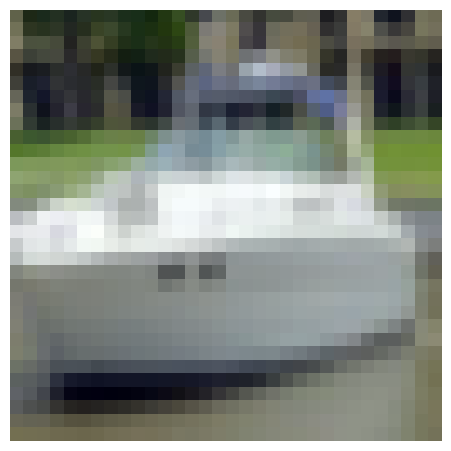

In [53]:
classes = test_loader.dataset.classes  # Get the class names from the dataset

def plot_figure(image):
    """
    Displays an image using matplotlib.

    Args:
        image (numpy.ndarray or torch.Tensor): The image to be displayed.
    """
    plt.imshow(np.transpose(image, (1, 2, 0)))  # Rearrange dimensions for visualization
    plt.axis('off')  # Hide axis
    plt.show()

# Randomly select a sample index from the test dataset
rnd_sample_idx = np.random.randint(len(test_loader.dataset))  

# Print the class of the randomly sampled image
print(f'The sampled image represents a: {classes[test_loader.dataset[rnd_sample_idx][1]]}')

# Get the image tensor and normalize it for display
image = test_loader.dataset[rnd_sample_idx][0]  
image = (image - image.min()) / (image.max() - image.min())  # Normalize the image

# Display the image
plot_figure(image)

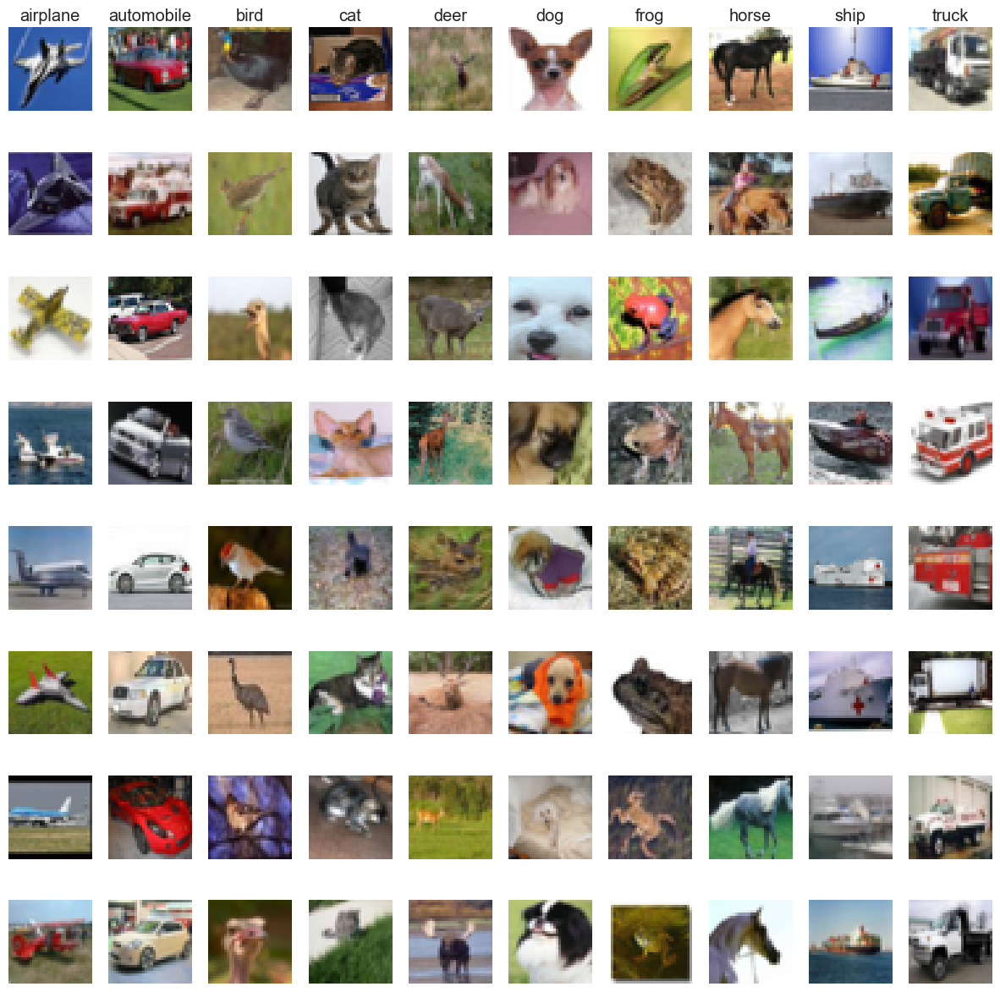

In [54]:
def plot_cifar10_grid(test_loader):
    """
    Plots a grid of CIFAR-10 images, displaying a set of samples per class.

    Args:
        test_loader (DataLoader): DataLoader for the test dataset.
    """
    classes = test_loader.dataset.classes  # Get class names
    total_samples = 8  # Number of samples per class
    plt.figure(figsize=(15, 15))  # Set figure size

    for label, class_name in enumerate(classes):
        # Get indices of all images belonging to the current class
        class_idxs = np.flatnonzero(np.array(test_loader.dataset.targets) == label)
        # Randomly select 'total_samples' images from the class
        sample_idxs = np.random.choice(class_idxs, total_samples, replace=False)

        for i, idx in enumerate(sample_idxs):
            plt_idx = i * len(classes) + label + 1  # Position in the grid
            plt.subplot(total_samples, len(classes), plt_idx)  # Create subplot

            img = test_loader.dataset.data[idx]  # Get image data

            # Verify and adjust the range of image values
            if img.min() < 0 or img.max() > 255:
                img = np.clip(img, 0, 255)

            # Ensure the image has 3 channels
            if img.ndim == 2:
                img = np.stack([img] * 3, axis=-1)

            plt.imshow(img.astype(np.uint8))  # Display the image
            plt.axis('off')  # Remove axes

            if i == 0:
                plt.title(class_name)  # Set class title on top images

    plt.show()

# Assuming test_loader is the DataLoader for the test set
plot_cifar10_grid(test_loader)


In [55]:
for i, (x, y) in enumerate(test_loader):
    print(i, x.shape, y.shape)  # Print batch index, input tensor shape, and label tensor shape

0 torch.Size([64, 3, 32, 32]) torch.Size([64])
1 torch.Size([64, 3, 32, 32]) torch.Size([64])
2 torch.Size([64, 3, 32, 32]) torch.Size([64])
3 torch.Size([64, 3, 32, 32]) torch.Size([64])
4 torch.Size([64, 3, 32, 32]) torch.Size([64])
5 torch.Size([64, 3, 32, 32]) torch.Size([64])
6 torch.Size([64, 3, 32, 32]) torch.Size([64])
7 torch.Size([64, 3, 32, 32]) torch.Size([64])
8 torch.Size([64, 3, 32, 32]) torch.Size([64])
9 torch.Size([64, 3, 32, 32]) torch.Size([64])
10 torch.Size([64, 3, 32, 32]) torch.Size([64])
11 torch.Size([64, 3, 32, 32]) torch.Size([64])
12 torch.Size([64, 3, 32, 32]) torch.Size([64])
13 torch.Size([64, 3, 32, 32]) torch.Size([64])
14 torch.Size([64, 3, 32, 32]) torch.Size([64])
15 torch.Size([64, 3, 32, 32]) torch.Size([64])
16 torch.Size([64, 3, 32, 32]) torch.Size([64])
17 torch.Size([64, 3, 32, 32]) torch.Size([64])
18 torch.Size([64, 3, 32, 32]) torch.Size([64])
19 torch.Size([64, 3, 32, 32]) torch.Size([64])
20 torch.Size([64, 3, 32, 32]) torch.Size([64])
21

### Calcular accuracy


In [56]:
def accuracy(model, loader):
    """
    Computes the accuracy of a model on a given DataLoader.

    Args:
        model (torch.nn.Module): The neural network model.
        loader (DataLoader): DataLoader containing the dataset for evaluation.

    Returns:
        float: The accuracy of the model (correct predictions / total samples).
    """
    num_correct = 0
    num_total = 0
    model.eval()  # Set the model to evaluation mode
    model = model.to(device=device)  # Move model to the specified device (CPU/GPU)
    
    with torch.no_grad():  # Disable gradient computation
        for xi, yi in loader:
            xi = xi.to(device, dtype=torch.float32)  # Move input data to device
            yi = yi.to(device, dtype=torch.long)  # Move labels to device
            
            scores = model(xi)  # Forward pass
            _, pred = scores.max(dim=1)  # Get predicted class
            
            num_correct += (pred == yi).sum()  # Count correct predictions
            num_total += pred.size(0)  # Count total samples

    return float(num_correct) / num_total  # Return accuracy as a float


### Loop de entrenamiento

In [57]:
def train(model, optimiser, epochs=100):
    """
    Trains the model using the provided DataLoader.

    Args:
    - model (torch.nn.Module): The PyTorch model to be trained.
    - optimiser (torch.optim.Optimizer): The optimizer used to update the model's weights.
    - epochs (int): Number of epochs for training.

    Returns:
    - None
    """
    model = model.to(device=device)  # Move the model to the specified device

    for epoch in range(epochs):
        for i, (xi, yi) in enumerate(train_loader):
            model.train()  # Set the model to training mode
            xi = xi.to(device=device, dtype=torch.float32)  # Move input data to device
            yi = yi.to(device=device, dtype=torch.long)  # Move labels to device
            
            scores = model(xi)  # Forward pass
            cost = F.cross_entropy(input=scores, target=yi)  # Compute loss
            
            optimiser.zero_grad()  # Clear previous gradients
            cost.backward()  # Backpropagation
            optimiser.step()  # Update model parameters
        
        acc = accuracy(model, val_loader)  # Compute validation accuracy
        print(f'Epoch: {epoch}, loss: {cost.item()}, accuracy: {acc}')


### Linear model

In [58]:
hidden1 = 256  # Number of neurons in the first hidden layer
hidden = 256  # Number of neurons in the second hidden layer
lr = 0.001  # Learning rate
epochs = 10  # Number of training epochs

# Define a simple feedforward neural network model
model1 = nn.Sequential(
    nn.Flatten(),  # Flatten the input image (32x32x3) into a 1D vector
    nn.Linear(in_features=32*32*3, out_features=hidden1),  # First fully connected layer
    nn.ReLU(),  # Activation function
    nn.Linear(in_features=hidden1, out_features=hidden),  # Second fully connected layer
    nn.ReLU(),  # Activation function
    nn.Linear(in_features=hidden, out_features=10)  # Output layer (10 classes for CIFAR-10)
)

# Define the optimizer (Adam) with the specified learning rate
optimiser = torch.optim.Adam(model1.parameters(), lr=lr)


In [59]:
train(model1, optimiser, epochs)  # Train the model with the specified optimizer and number of epochs


Epoch: 0, loss: 1.360537052154541, accuracy: 0.4736
Epoch: 1, loss: 1.798497200012207, accuracy: 0.4908
Epoch: 2, loss: 1.0332804918289185, accuracy: 0.5192
Epoch: 3, loss: 0.8371182680130005, accuracy: 0.5112
Epoch: 4, loss: 1.3273630142211914, accuracy: 0.5318
Epoch: 5, loss: 1.0871645212173462, accuracy: 0.5196
Epoch: 6, loss: 0.9319652915000916, accuracy: 0.5166
Epoch: 7, loss: 0.978959858417511, accuracy: 0.5204
Epoch: 8, loss: 0.6333770751953125, accuracy: 0.5278
Epoch: 9, loss: 0.5676348209381104, accuracy: 0.5218


### Sequential CNN

### Justification for the Selected CNN Architecture
The chosen Convolutional Neural Network (CNN) architecture is designed to efficiently process image data from the CIFAR-10 dataset while maintaining a balance between model complexity and computational efficiency. Below is the justification for each layer:

First Convolutional Layer (Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1))

This layer applies 16 convolutional filters of size 3×3 to the input image, preserving the spatial resolution due to padding (padding=1).
It extracts low-level features such as edges and textures from the original 3-channel (RGB) input images.
Activation Function (ReLU())

The Rectified Linear Unit (ReLU) introduces non-linearity to help the network learn more complex patterns.
Second Convolutional Layer (Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1))

This layer applies 32 convolutional filters of size 3×3 to the feature maps from the previous layer, further refining the learned features.
Increasing the number of filters allows the network to learn higher-level representations such as shapes and object parts.
Activation Function (ReLU())

Another ReLU activation ensures that non-linearity is preserved and helps in better feature extraction.
Max Pooling Layer (MaxPool2d(2, 2))

This layer performs downsampling, reducing the spatial dimensions from 32×32 to 16×16.
Pooling helps retain the most important features while reducing the computational cost.
Flatten Layer (Flatten())

Converts the 2D feature maps into a 1D vector to feed into a fully connected layer.
Fully Connected Layer (Linear(in_features=16*16*32, out_features=10))

The final fully connected (FC) layer maps the extracted features to 10 output neurons, corresponding to the 10 CIFAR-10 classes.
The number of input features 16×16×32 comes from the flattened feature maps after convolution and pooling.
Key Considerations:
The convolutional layers extract local features and increase feature depth.
The pooling layer reduces computational complexity while retaining key information.
The final dense layer maps extracted features to class scores for classification.
The use of ReLU activations ensures non-linearity and avoids vanishing gradients.
This architecture strikes a balance between accuracy and efficiency, making it a solid choice for CIFAR-10 image classification.

In [60]:
channel1 = 16  # Number of filters in the first convolutional layer
channel2 = 32  # Number of filters in the second convolutional layer
epochs = 15  # Number of training epochs
lr = 0.0001  # Learning rate

# Define a simple CNN model
modelCNN1 = nn.Sequential(
    nn.Conv2d(in_channels=3, out_channels=channel1, kernel_size=3, padding=1),  # First convolutional layer
    nn.ReLU(),  # Activation function
    nn.Conv2d(in_channels=channel1, out_channels=channel2, kernel_size=3, padding=1),  # Second convolutional layer
    nn.ReLU(),  # Activation function
    nn.MaxPool2d(2, 2),  # Max pooling layer (reduces spatial dimensions by half)
    nn.Flatten(),  # Flatten the feature maps into a vector
    nn.Linear(in_features=16*16*channel2, out_features=10)  # Fully connected output layer (10 classes)
)

# Define the optimizer (Adam) with the specified learning rate
optimiser = torch.optim.Adam(modelCNN1.parameters(), lr)


In [61]:
train(modelCNN1, optimiser, epochs)  # Train the CNN model with the specified optimizer and number of epochs

Epoch: 0, loss: 1.4375216960906982, accuracy: 0.4888
Epoch: 1, loss: 1.1527704000473022, accuracy: 0.5388
Epoch: 2, loss: 2.133357286453247, accuracy: 0.5704
Epoch: 3, loss: 0.8621857762336731, accuracy: 0.5878
Epoch: 4, loss: 1.0030403137207031, accuracy: 0.5944
Epoch: 5, loss: 1.1350891590118408, accuracy: 0.6096
Epoch: 6, loss: 0.9625204801559448, accuracy: 0.6214
Epoch: 7, loss: 1.1408342123031616, accuracy: 0.6336
Epoch: 8, loss: 0.6055077910423279, accuracy: 0.6382
Epoch: 9, loss: 0.6920444369316101, accuracy: 0.6434
Epoch: 10, loss: 1.1155966520309448, accuracy: 0.6532
Epoch: 11, loss: 1.2151734828948975, accuracy: 0.6592
Epoch: 12, loss: 0.9296755194664001, accuracy: 0.653
Epoch: 13, loss: 0.864855170249939, accuracy: 0.6632
Epoch: 14, loss: 0.7023085355758667, accuracy: 0.6614


### Final Conclusions on CNN Model Training
The training results indicate a steady improvement in accuracy over the 15 training epochs, reaching a final validation accuracy of 66.14%. Below are the key observations and conclusions:

1. Accuracy Improvement Over Epochs
The model started with an initial accuracy of 48.88%, demonstrating that it was learning from the dataset.
There was a consistent increase in accuracy over the epochs, reaching 66.14% by the end of training.
The accuracy gain per epoch slowed down towards the later stages, suggesting that the model was approaching its learning capacity under the given conditions.
2. Loss and Overfitting Considerations
The loss fluctuated at certain points (e.g., Epoch 2: 2.13 loss, Epoch 6: 0.96 loss), which could be due to high learning rate effects or variations in batch processing.
Despite fluctuations, the loss trend suggests that the model successfully minimized the classification error.
Overfitting does not appear to be a major issue yet, but further training beyond 15 epochs might require monitoring the gap between training and validation accuracy.
3. Model Performance & Possible Improvements
A 66.14% validation accuracy is a reasonable outcome for a basic CNN architecture on CIFAR-10.
Possible improvements to enhance accuracy:
Data Augmentation: Adding techniques like random cropping, flipping, or brightness adjustments could enhance generalization.
Batch Normalization: This can help stabilize training and potentially improve convergence.
More Convolutional Layers: Deeper networks can extract more complex features, leading to better performance.
Hyperparameter Tuning: Experimenting with different learning rates, optimizer choices (e.g., SGD with momentum), and activation functions could lead to better results.
4. Final Thoughts
This CNN model effectively learned to classify images in the CIFAR-10 dataset with decent accuracy. However, further optimizations and architectural enhancements could push the accuracy beyond 70% or higher. If higher performance is required, exploring deeper architectures (ResNet, VGG, etc.) would be a logical next step.